<a href="https://colab.research.google.com/github/ShreyJais/CV_MScAIML/blob/main/Lab_01_CV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

(2052, 1200, 3)


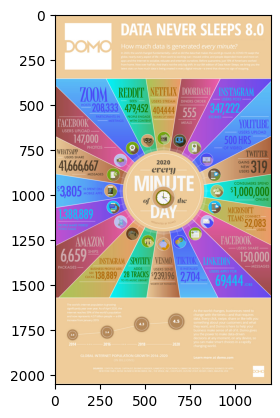

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
image = cv2.imread('/content/drive/MyDrive/internet-minute-2020.jpg')
plt.imshow(image)
print(image.shape)

In [ ]:
image.shape[0]*image.shape[1]%9

0

#1. Use filter2D & convolve function

(2052, 1200, 3)


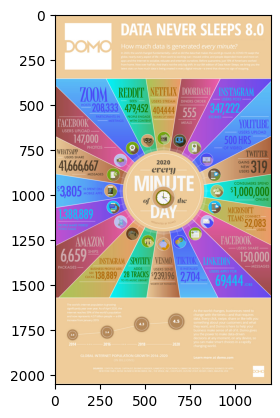

In [ ]:
filter1 = np.array([[0, 0, 0],
                    [0, 1, 0],
                    [0, 0, 0]])
img = cv2.filter2D(src=image, ddepth=-1, kernel=filter1)
plt.imshow(img)
print(img.shape)

Syntax: filter2D (src, dst, ddepth, kernel)

Parameters:  

* Src – The source image to apply the filter on.
* Dst – Name of the output image after applying the filter
* Ddepth – Depth of the output image [ -1 will give the output image depth as same as the input image]
* Kernel – The 2d matrix we want the image to convolve with.


#2.1 Identity kernel

(2052, 1200, 3)


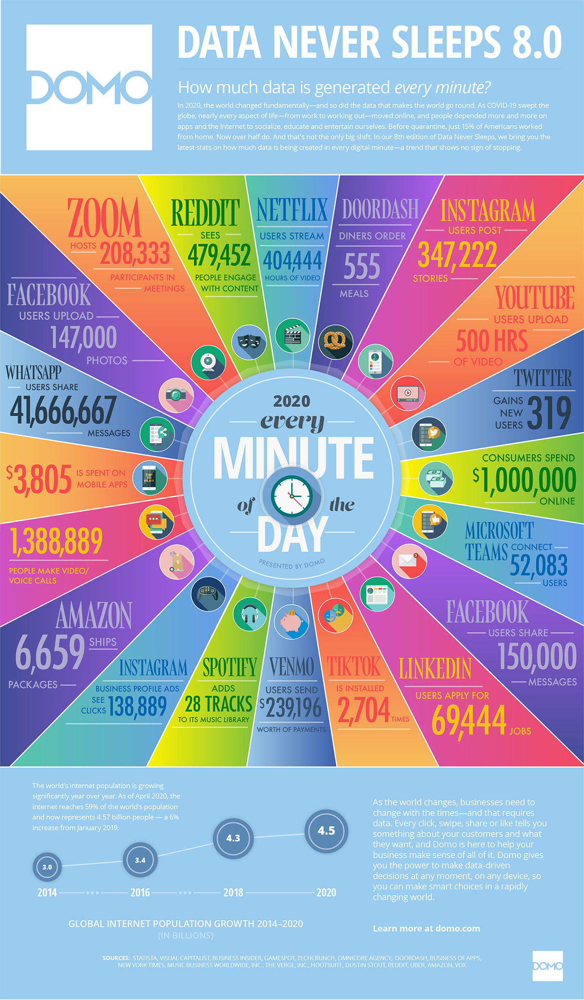

In [ ]:
filter2 = np.array([[0, 0, 0],
                    [0, 1, 0],
                    [0, 0, 0]])
img = cv2.filter2D(src=image, ddepth=-1, kernel=filter2)

print(img.shape)
cv2_imshow(img)

#2.2 Edge detection kernel

(2052, 1200, 3)


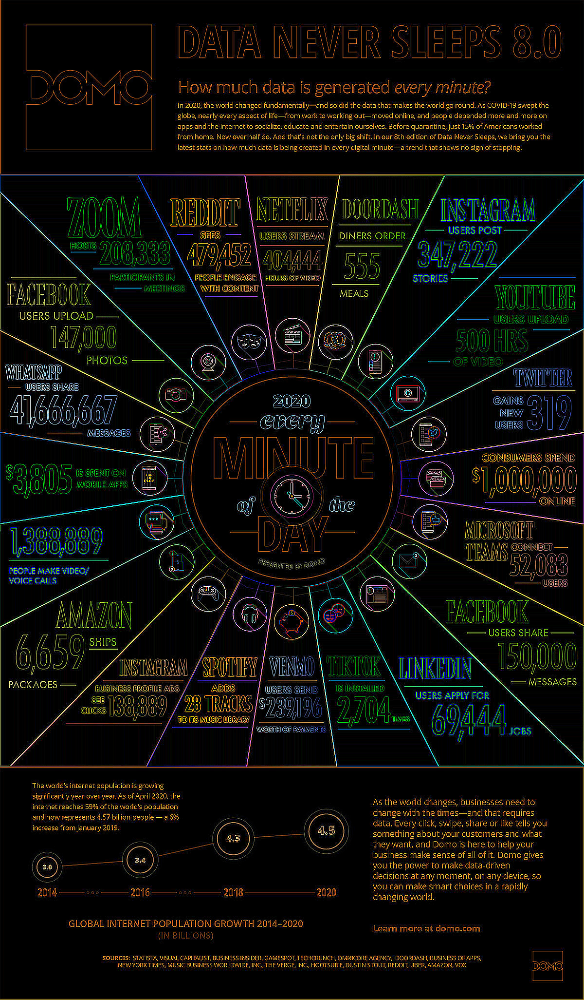

In [ ]:
filter3 = np.array([[-1, -1, -1],
                    [-1, 8, -1],
                    [-1, -1, -1]])
img = cv2.filter2D(src=image, ddepth=-1, kernel=filter3)

print(img.shape)
cv2_imshow(img)

#2.3 Sharpen Kernel

(2052, 1200, 3)


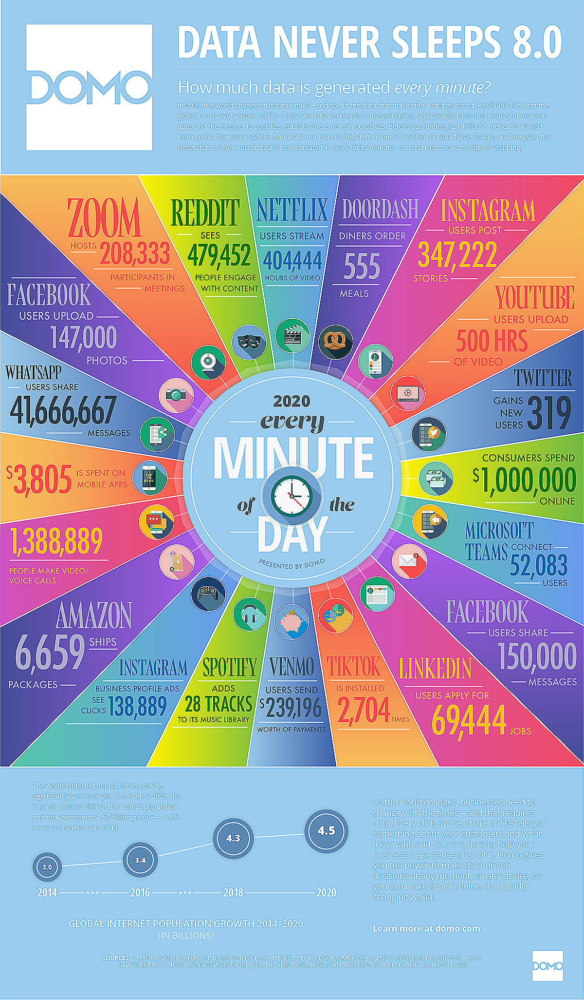

In [ ]:
filter4 = np.array([[0, -1, 0],
                    [-1, 5, -1],
                    [0, -1, 0]])
img = cv2.filter2D(src=image, ddepth=-1, kernel=filter4)
print(img.shape)
cv2_imshow(img)

#2.4 Box Blur Kernel

(2052, 1200, 3)


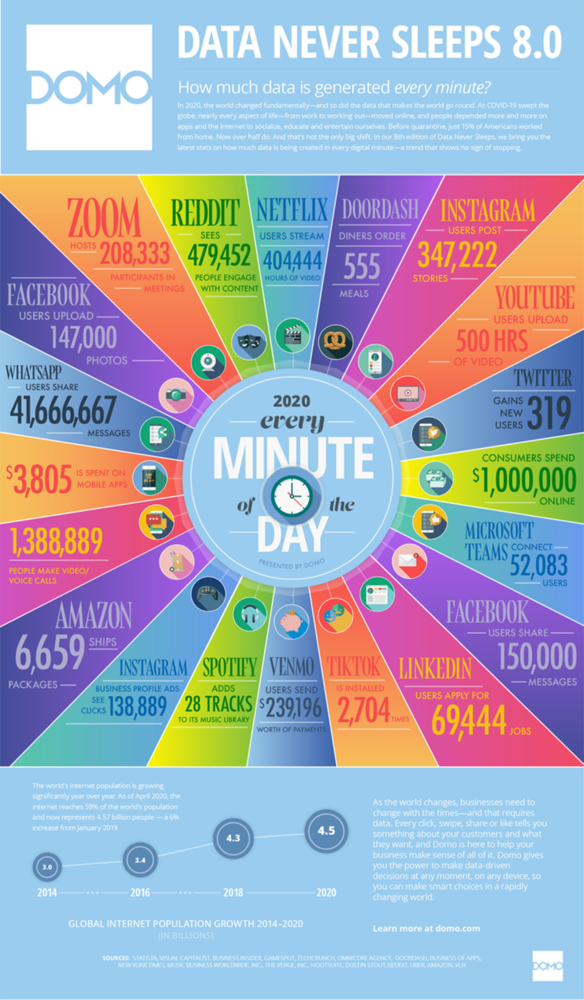

In [ ]:
filter5 = np.array([[1, 1, 1],
                    [1, 1, 1],
                    [1, 1, 1]])/9 #for 3*3 kernal

img = cv2.filter2D(src=image, ddepth=-1, kernel=filter5)
print(img.shape)
cv2_imshow(img)

In [ ]:
#kernel is always square matrix
def box_blur_kernel(size):
  kernel = np.ones((size, size)) / (size ** 2)
  return kernel

There are a few reasons why square kernels are often preferred:
* They are easier to create and use.
* They produce symmetrical blurring.
* They are more efficient to compute.
> However, there are also some cases where non-square kernels are useful. For example, a rectangular kernel can be used to blur an image in one direction more than the other. This can be useful for creating special effects, such as motion blur.

Here are some examples of non-square kernels:
* A 1x3 kernel can be used to blur an image horizontally.
* A 3x1 kernel can be used to blur an image vertically.
* A 5x5 kernel can be used to blur an image in both directions equally.

Enter the size of box_blur_kernel :	23
box blure kernel of size:	 23 
 [[0.00189036 0.00189036 0.00189036 0.00189036 0.00189036 0.00189036
  0.00189036 0.00189036 0.00189036 0.00189036 0.00189036 0.00189036
  0.00189036 0.00189036 0.00189036 0.00189036 0.00189036 0.00189036
  0.00189036 0.00189036 0.00189036 0.00189036 0.00189036]
 [0.00189036 0.00189036 0.00189036 0.00189036 0.00189036 0.00189036
  0.00189036 0.00189036 0.00189036 0.00189036 0.00189036 0.00189036
  0.00189036 0.00189036 0.00189036 0.00189036 0.00189036 0.00189036
  0.00189036 0.00189036 0.00189036 0.00189036 0.00189036]
 [0.00189036 0.00189036 0.00189036 0.00189036 0.00189036 0.00189036
  0.00189036 0.00189036 0.00189036 0.00189036 0.00189036 0.00189036
  0.00189036 0.00189036 0.00189036 0.00189036 0.00189036 0.00189036
  0.00189036 0.00189036 0.00189036 0.00189036 0.00189036]
 [0.00189036 0.00189036 0.00189036 0.00189036 0.00189036 0.00189036
  0.00189036 0.00189036 0.00189036 0.00189036 0.00189036 0.00189036
  0.001

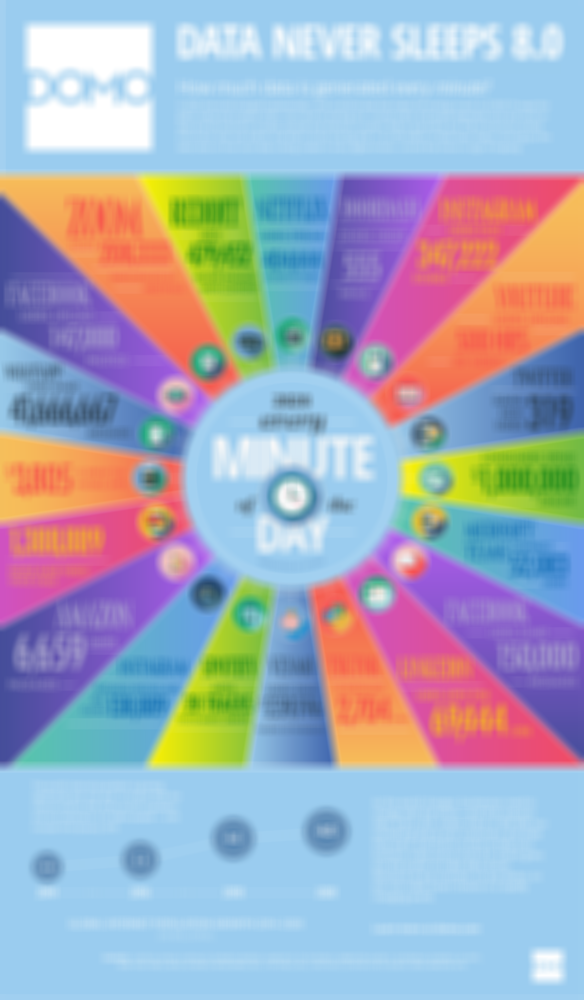

In [ ]:
Size = int(input("Enter the size of box_blur_kernel :\t"))
box_blur = box_blur_kernel(Size)
print("box blure kernel of size:\t",Size,"\n",box_blur)
img = cv2.filter2D(src=image, ddepth=-1, kernel=box_blur)
print(img.shape)
cv2_imshow(img)

#2.5 Gaussian Blur Kernel

In [ ]:
image.shape[0]*image.shape[1]%25

0

(2052, 1200, 3)


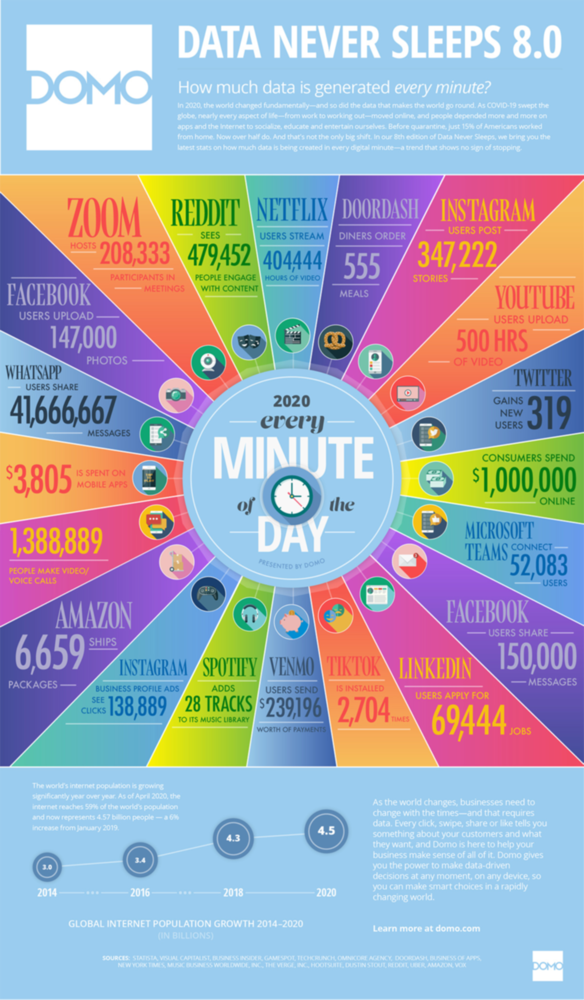

In [ ]:
#Gaussian Blur Kernel for 5*5
filter6 = np.array([[1,  4,  6,  4, 1],
                    [4, 16, 24, 16, 4],
                    [6, 24, 36, 24, 6],
                    [4, 16, 24, 16, 4],
                    [1,  4,  6,  4, 1]])/256

img = cv2.filter2D(src=image, ddepth=-1, kernel=filter6)
print(img.shape)
cv2_imshow(img)

#3. Apply Convolve function in SCIPY library and use the following mode: ‘reflect’, ‘constant’, ‘nearest’, ‘mirror’, ‘wrap'

Convolve mode:	 reflect


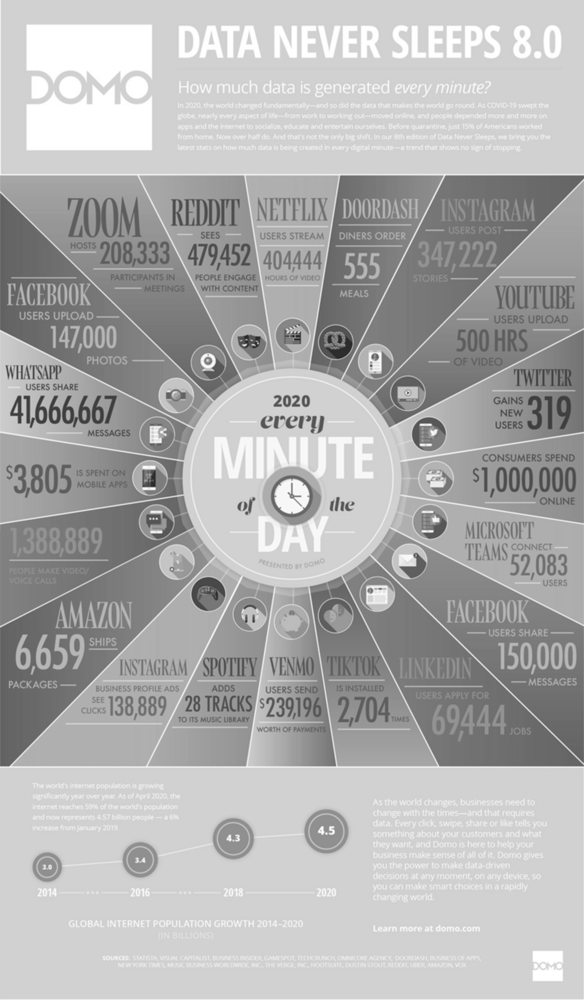

Convolve mode:	 constant


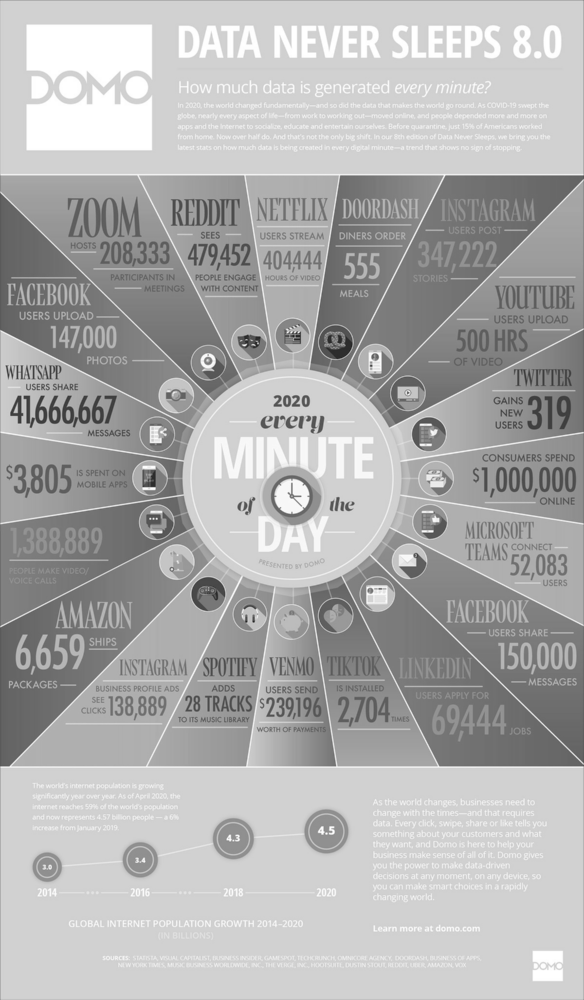

Convolve mode:	 nearest


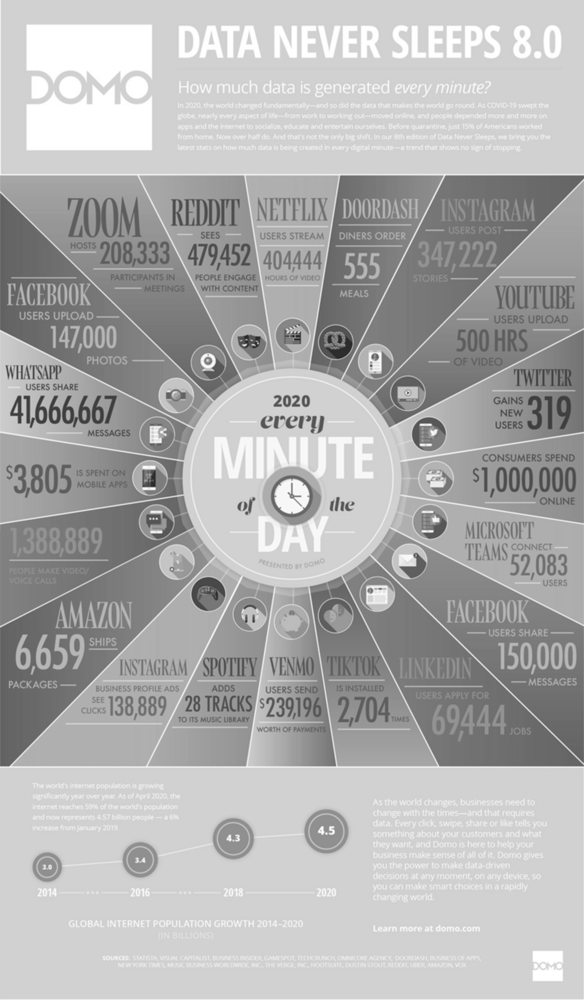

Convolve mode:	 mirror


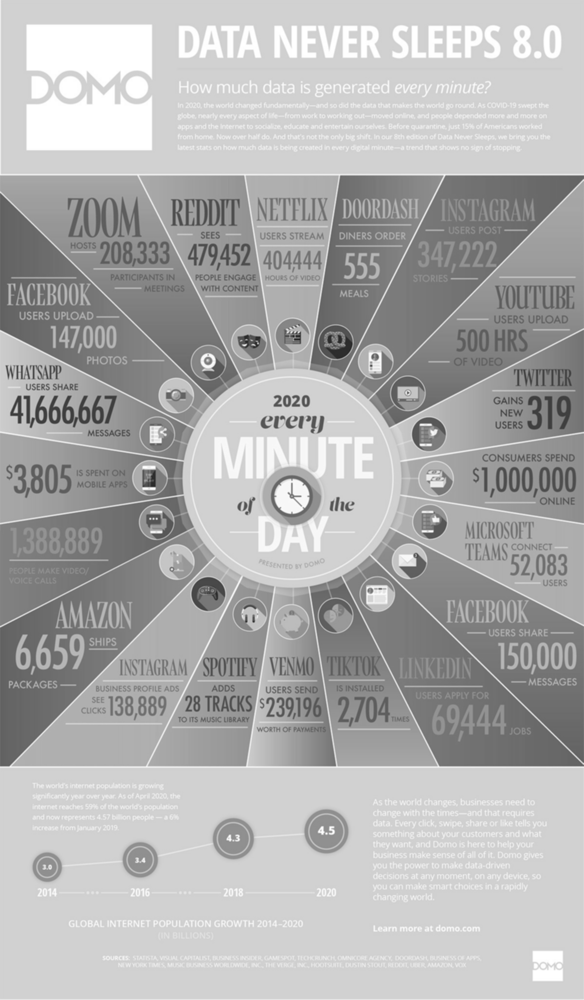

Convolve mode:	 wrap


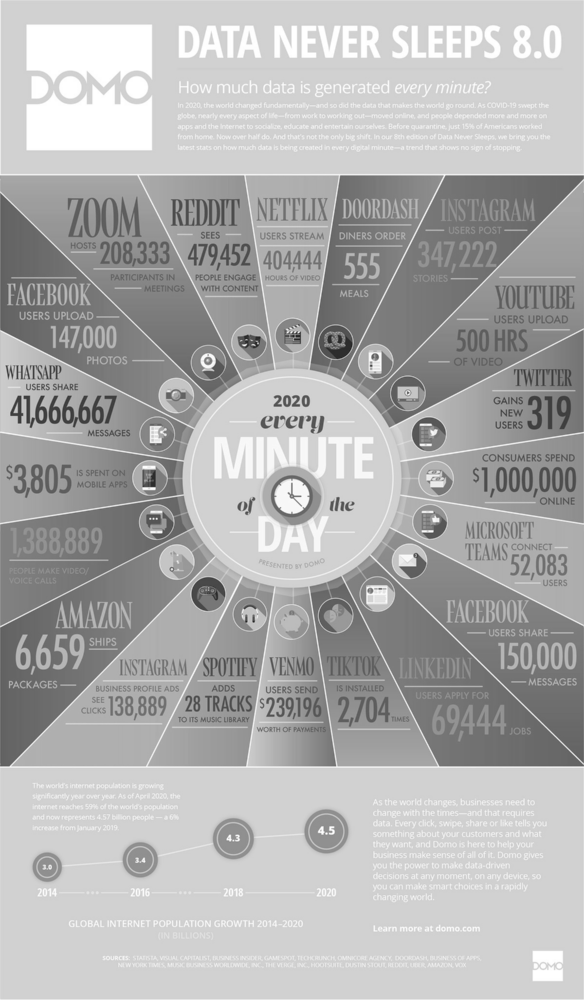

In [ ]:
from scipy import ndimage
gray_img = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
for m in ['reflect', 'constant', 'nearest', 'mirror', 'wrap']:
  print("Convolve mode:\t",m)
  img=ndimage.convolve(gray_img,filter5,mode=m)
  cv2_imshow(img)

* ‘reflect’ (d c b a | a b c d | d c b a)
The input is extended by reflecting about the edge of the last pixel. This mode is also sometimes referred to as half-sample symmetric.
* ‘constant’ (k k k k | a b c d | k k k k)
The input is extended by filling all values beyond the edge with the same constant value, defined by the cval parameter.
* ‘nearest’ (a a a a | a b c d | d d d d)
The input is extended by replicating the last pixel.
* ‘mirror’ (d c b | a b c d | c b a)
The input is extended by reflecting about the center of the last pixel. This mode is also sometimes referred to as whole-sample symmetric.
* ‘wrap’ (a b c d | a b c d | a b c d)
The input is extended by wrapping around to the opposite edge.
